## SPACE-GM Tutorial

This tutorial demonstrates the workflow of SPACE-GM, which contains the following steps:

1. Construct cellular graphs with raw inputs
2. Construct `CellularGraphDataset` and attach node-level / graph-level tasks
3. Initialize a Graph Neural Network (GNN) according to the prediction tasks
4. Train the GNN by randomly sampling subgraphs
5. Evaluate the GNN on node-level / graph-level tasks

In [1]:
import warnings
warnings.filterwarnings("ignore")
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch.nn as nn

------------
### Step 1: Construct Cellular Graphs

We first construct cellular graphs as `networkx.Graph` using raw inputs including cell coordinates, cell types, biomarker expression, etc.

Raw files are assumed to be sorted in regions, each region should contain a spatially-continuous area of tissue and has all cells in the area identified and segmented.

For each region, we consider the following raw inputs:
- Cell coordinates stored in a csv file:
    - This file should contain at least two columns `X` and `Y` representing the 2D coordinates of cell centroids.
    - We highly recommend adding another column `CELL_ID` to match the rows with other raw inputs.
    - Example:
    | CELL_ID | X | Y |
    | --- | --- | --- |
    | 0 | 3 | 10 |
    | 1 | 25 | 12 |
    | 2 | 16 | 30 |
    | 3 | 32 | 26 |

- (Optional) Cell types stored in a csv file:
    - This file should contain at least one column other than `CELL_ID`, in which case this column will be treated as the cell type column. Otherwise, please explicitly name the cell type column as `CELL_TYPE`.
    - Example:
    | CELL_ID | CELL_TYPE |
    | --- | --- |
    | 0 | CD4 T cell |
    | 1 | CD8 T cell |
    | 2 | Tumor cell |
    | 3 | B cell |

- (Optional) Cell biomarker expression stored in a csv file:
    - This file should contain at least one column other than `CELL_ID`. All numeric columns in this file (other than `CELL_ID`) will be treated as biomarkers
    - Example (note that column `REGION_ID` will not be considered as a biomarker in this example):
    | CELL_ID | REGION_ID | BIOMARKER1 | BIOMARKER 2|
    | --- | --- | --- | --- |
    | 0 | region1 | 0.5 | 1.1 |
    | 1 | region1 | 0.8 | 2.3 |
    | 2 | region1 | 1.5 | 0.9 |
    | 3 | region1 | 5.5 | 0.1 |

- (Optional) Additional cell features stored in a csv file:
    - This file should contain at least one column other than `CELL_ID`. All numeric columns in this file (other than `CELL_ID`) will be treated as additional features for the cells
    - Example (column `SIZE` will be added as additional node attributes to the cellular graph):
    | CELL_ID | SIZE |
    | --- | --- |
    | 0 | 0.2 |
    | 1 | 0.5 |
    | 2 | 0.8 |
    | 3 | 0.1 |

- (Optional) Coordinates for the cell voronoi polygons:
    - Stored in a `json` or a `pickle` file. This file should contain a list of voronoi polygons enclosing cells.
    - Note that voronoi polygons can be calculated on-the-fly based on cell coordinates.
    - Example of content:
        ```text
        [array([[22.5, 22. ],
                [32.3, 17.1],
                [32.3, 12.5],
                [32.3, 0.  ],
                [18.8, 0.  ],
                [15.,  0.  ],
                [13.4, 17.5],
                [22.5, 22. ]]),
         array([[ 0. , 28.9],
                [ 0. , 30.3],
                [ 7.8, 30.3],
                [24.6, 30.3],
                [22.5, 22. ],
                [13.4, 17.5],
                [ 0. , 26.2],
                [ 0. , 28.9]]),
         array([[ 0. , 26.2],
                [13.4, 17.5],
                [15. ,  0. ],
                [12.3,  0. ],
                [ 0. ,  0. ],
                [ 0. , 18.8],
                [ 0. , 26.2]]),
         array([[24.6, 30.3],
                [28.2, 30.3],
                [32.3, 30.3],
                [32.3, 25.1],
                [32.3, 17.1],
                [22.5, 22. ],
                [24.6, 30.3]])]
        ```

Additionally, to train models for graph-level (region-level) tasks, a separate csv file is required to provide the labels:
- Labels for graph-level tasks:
    - The first column of this file must be `REGION_ID`: identifiers for regions in the dataset. This column will be used as the index for graph labels stored in `spacegm.inference.AddGraphLabel`.
    - The following columns store labels for graph-level tasks, with task names as column names.
    - Example:

    | REGION_ID | GRAPH_TASK1 | GRAPH_TASK 2|
    | --- | --- | --- |
    | region 1 | 0 | 1 |
    | region 2 | 0 | 0 |
    | region 3 | 1 | 1 |

<br/><br/><br/><br/>
We provided some example files under `data/voronoi`:

In [8]:
from hypgs.utils.graph_build import load_cell_coords, load_cell_types, load_cell_biomarker_expression, load_cell_features, construct_graph_for_region
from hypgs import DATA_DIR
import os
region_id = "UPMC_c001_v001_r001_reg001"
cell_coords_file = os.path.join(DATA_DIR,'/upmc/raw_data_upmc/UPMC_c001_v001_r001_reg001.cell_data.csv') 
cell_types_file = os.path.join(DATA_DIR,'/upmc/raw_data_upmc/UPMC_c001_v001_r001_reg001.cell_types.csv')
cell_biomarker_expression_file = os.path.join(DATA_DIR,'/upmc/raw_data_upmc/UPMC_c001_v001_r001_reg001.expression.csv')
cell_features_file = os.path.join(DATA_DIR,'/upmc/raw_data_upmc/UPMC_c001_v001_r001_reg001.cell_features.csv')
print(DATA_DIR)
# list the direcotires in DATA_DIR
print(os.listdir(DATA_DIR))

graph_label_file = os.path.join(DATA_DIR,'/upmc/upmc_labels.csv')
print(cell_coords_file)
print("\nInputs for region %s:" % region_id)
print("\nCell coordinates")
display(load_cell_coords(cell_coords_file))
print("\nCell types")
display(load_cell_types(cell_types_file))
print("\nCell biomarker expression")
display(load_cell_biomarker_expression(cell_biomarker_expression_file))
print("\nAdditional cell features")
display(load_cell_features(cell_features_file))

print("\nGraph-level tasks")
display(pd.read_csv(graph_label_file, index_col=0))

/vast/palmer/home.mccleary/sumry2023_cqx3/hypergraph_scattering/hypgs/../data
['ENZYMES', 'HighSchool', 'MUTAG', 'PrimarySchool', 'Synthetic', 'music_makam', 'spatial_data', 'text_bbc', 'upmc']
/upmc/raw_data_upmc/UPMC_c001_v001_r001_reg001.cell_data.csv

Inputs for region UPMC_c001_v001_r001_reg001:

Cell coordinates


FileNotFoundError: [Errno 2] No such file or directory: '/upmc/raw_data_upmc/UPMC_c001_v001_r001_reg001.cell_data.csv'

<br/><br/><br/><br/>

A networkx graph can be constructed using the inputs above

In [5]:
print("Constructing nx graph for region %s" % region_id)
G = construct_graph_for_region(
    region_id,
    cell_coords_file=cell_coords_file,
    cell_types_file=cell_types_file,
    cell_biomarker_expression_file=cell_biomarker_expression_file,
    cell_features_file=cell_features_file)
print(G)

print("Information stored in a node:")
print(G.nodes[0])

Constructing nx graph for region UPMC_c001_v001_r001_reg001
Graph with 4360 nodes and 12906 edges
Information stored in a node:
{'voronoi_polygon': array([[   0.        , 1876.97435897],
       [   0.        , 1969.71582734],
       [  43.10830986, 1952.3484507 ],
       [  62.        , 1921.76190476],
       [  62.        , 1854.32432432],
       [  34.3863109 , 1846.11484919],
       [   0.        , 1876.97435897]]), 'cell_id': 4068, 'center_coord': (47, 1870), 'cell_type': 'Tumor (CD21+)', 'biomarker_expression': {'ASMA': -0.457205886260331, 'CD11B': -0.237593933277609, 'CD14': -0.669566976475416, 'CD15': -0.469059248614999, 'CD163': 1.3789662022489, 'CD20': -0.509104558829099, 'CD21': 0.385200857839643, 'CD31': -0.0710839975324695, 'CD34': -0.319751813083942, 'CD3E': -0.261178834832132, 'CD4': -0.543252753403106, 'CD45': -0.695592943068247, 'CD45RA': -0.763361014924648, 'CD45RO': -0.361664278853364, 'CD68': -0.464953421080786, 'CD8': -0.282202840046479, 'COLLAGENIV': -0.31713591662

In [31]:
from networkx.algorithms.planarity import is_planar, check_planarity
is_planar(G)

False

In [25]:
from hypgs.data.spacegm_graphbuild_utils import calcualte_voronoi_from_coords, merge_cell_dataframes, build_graph_from_voronoi_polygons, build_voronoi_polygon_to_cell_mapping, build_graph_from_cell_coords, assign_attributes, plot_voronoi_polygons, plot_graph

region_id,
cell_coords_file=cell_coords_file
cell_types_file=cell_types_file
cell_biomarker_expression_file=cell_biomarker_expression_file
cell_features_file=cell_features_file
voronoi_file= None
graph_source='polygon'
graph_output=None
voronoi_polygon_img_output=None
graph_img_output=None
figsize=10
"""Construct cellular graph for a region

Args:
    region_id (str): region id
    cell_coords_file (str): path to csv file containing cell coordinates
    cell_types_file (str): path to csv file containing cell types/annotations
    cell_biomarker_expression_file (str): path to csv file containing cell biomarker expression
    cell_features_file (str): path to csv file containing additional cell features
        Note that features stored in this file can only be numeric and
        will be saved and used as is.
    voronoi_file (str): path to the voronoi coordinates file
    graph_source (str): source of edges in the graph, either "polygon" or "cell"
    graph_output (str): path for saving cellular graph as gpickle
    voronoi_polygon_img_output (str): path for saving voronoi image
    graph_img_output (str): path for saving dot-line graph image
    figsize (int): figure size for plotting

Returns:
    G (nx.Graph): full cellular graph of the region
"""
assert cell_coords_file is not None, "cell coordinates must be provided"
cell_data = load_cell_coords(cell_coords_file)

if voronoi_file is None:
    # Calculate voronoi polygons based on cell coordinates
    voronoi_polygons = calcualte_voronoi_from_coords(cell_data['X'], cell_data['Y'])
else:
    # Load voronoi polygons from file
    voronoi_polygons = read_raw_voronoi(voronoi_file)

if cell_types_file is not None:
    # Load cell types
    cell_types = load_cell_types(cell_types_file)
    cell_data = merge_cell_dataframes(cell_data, cell_types)

if cell_biomarker_expression_file is not None:
    # Load cell biomarker expression
    cell_expression = load_cell_biomarker_expression(cell_biomarker_expression_file)
    cell_data = merge_cell_dataframes(cell_data, cell_expression)

if cell_features_file is not None:
    # Load additional cell features
    additional_cell_features = load_cell_features(cell_features_file)
    cell_data = merge_cell_dataframes(cell_data, additional_cell_features)

if graph_source == 'polygon':
    # Build initial cellular graph
    G_ = build_graph_from_voronoi_polygons(voronoi_polygons)
    # Construct matching between voronoi polygons and cells
    node_to_cell_mapping = build_voronoi_polygon_to_cell_mapping(G_, voronoi_polygons, cell_data)
    # Prune graph to contain only voronoi polygons that have corresponding cells
    G = G_.subgraph(node_to_cell_mapping.keys())
elif graph_source == 'cell':
    G, node_to_cell_mapping = build_graph_from_cell_coords(cell_data, voronoi_polygons)
else:
    raise ValueError("graph_source must be either 'polygon' or 'cell'")

# Assign attributes to cellular graph
G = assign_attributes(G, cell_data, node_to_cell_mapping)
G.region_id = region_id

<Figure size 640x480 with 0 Axes>

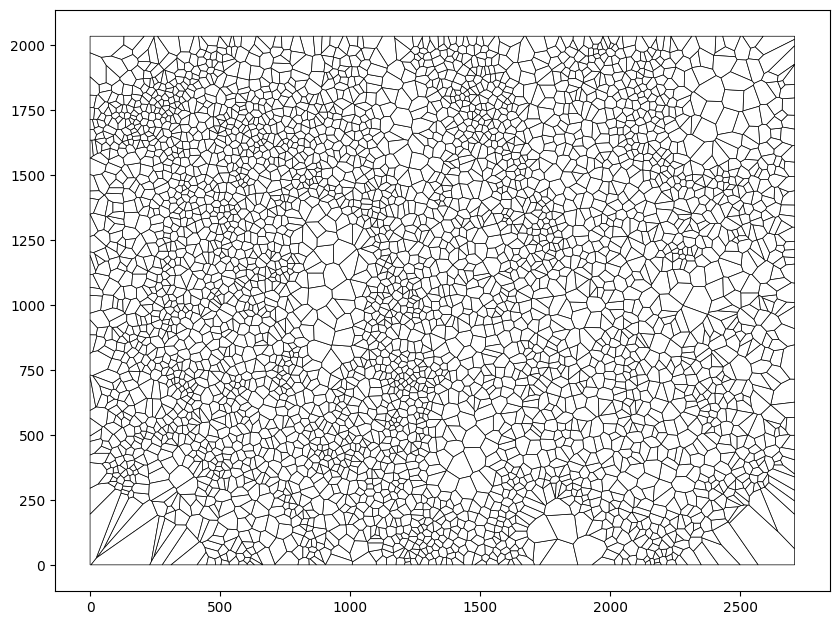

In [26]:
plt.clf()
plt.figure(figsize=(figsize, figsize))
plot_voronoi_polygons(G)
plt.axis('scaled')
plt.show()    

<Figure size 640x480 with 0 Axes>

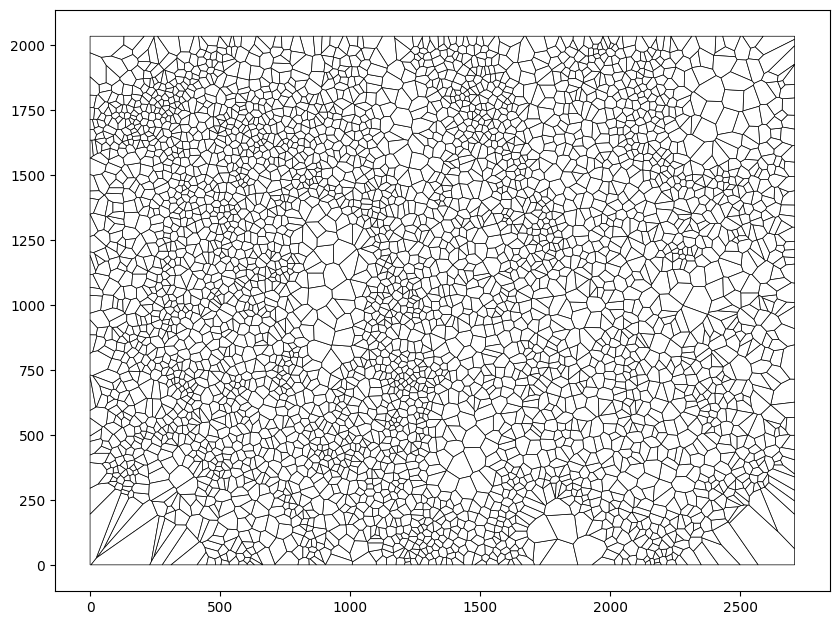

In [27]:
plt.clf()
plt.figure(figsize=(figsize, figsize))
plot_voronoi_polygons(voronoi_polygons)
plt.axis('scaled')
plt.show()    

<Figure size 640x480 with 0 Axes>

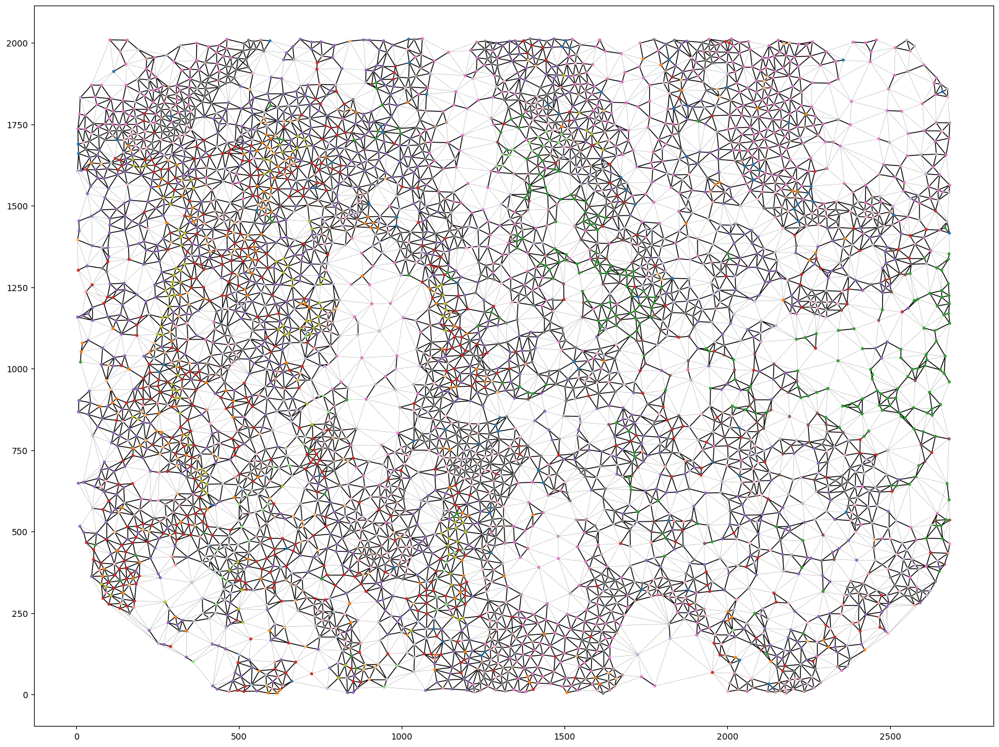

In [28]:
plt.clf()
plt.figure(figsize=(20, 20))
plot_graph(G)
plt.axis('scaled')
plt.show()

<Figure size 640x480 with 0 Axes>

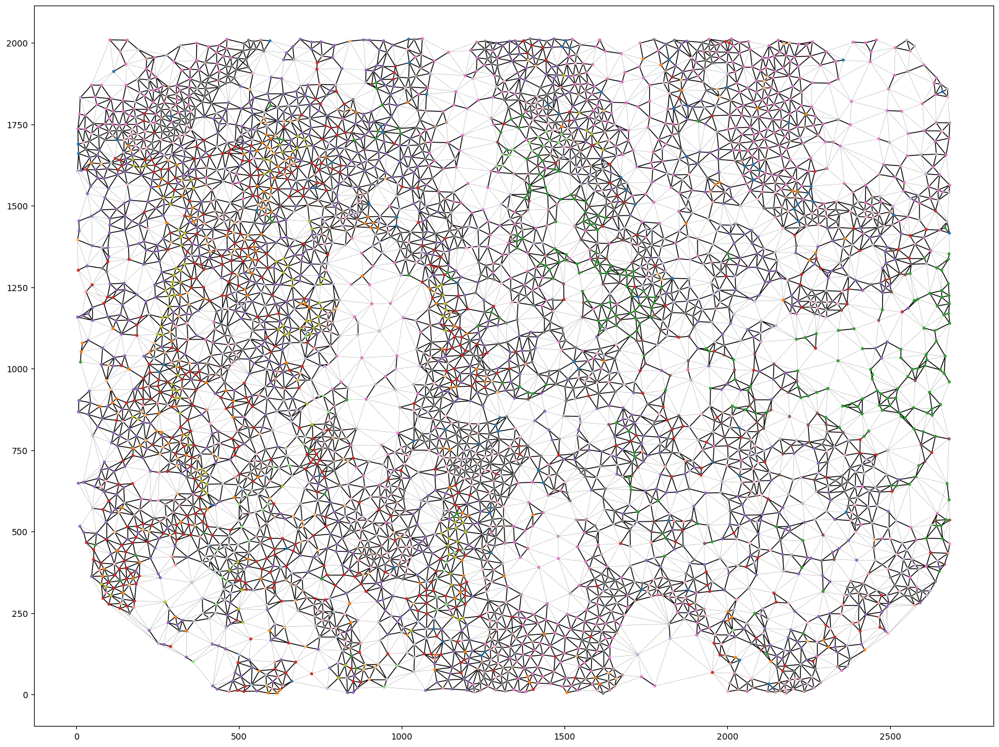

In [29]:
plt.clf()
plt.figure(figsize=(20, 20))
plot_graph(G_)
plt.axis('scaled')
plt.show()

In [ ]:
G == G_

In [38]:
G = build_graph_from_voronoi_polygons(voronoi_polygons)
is_planar(G)

False

In [37]:
for (i,j,edge_type) in G.edges.data():
    print(edge_type["edge_type"])

distant
neighbor
neighbor
distant
neighbor
distant
neighbor
neighbor
distant
neighbor
distant
distant
distant
distant
neighbor
neighbor
neighbor
neighbor
neighbor
distant
neighbor
distant
neighbor
neighbor
neighbor
distant
neighbor
neighbor
distant
neighbor
neighbor
distant
distant
neighbor
neighbor
neighbor
neighbor
distant
distant
distant
neighbor
neighbor
neighbor
neighbor
distant
distant
distant
neighbor
neighbor
distant
distant
distant
neighbor
neighbor
neighbor
neighbor
neighbor
neighbor
neighbor
neighbor
distant
distant
neighbor
neighbor
neighbor
distant
distant
distant
neighbor
neighbor
distant
distant
neighbor
neighbor
neighbor
distant
neighbor
distant
neighbor
distant
distant
distant
neighbor
distant
neighbor
distant
distant
distant
distant
distant
neighbor
neighbor
neighbor
neighbor
neighbor
neighbor
neighbor
neighbor
neighbor
neighbor
neighbor
neighbor
neighbor
neighbor
neighbor
neighbor
neighbor
neighbor
neighbor
neighbor
neighbor
neighbor
neighbor
neighbor
distant
neighbo

<br/><br/><br/><br/>
Then we process all four regions from the example files and store the nx graphs into a dataset folder

In [4]:
raw_data_root = "data/voronoi/"

dataset_root = "data/example_dataset"
nx_graph_root = os.path.join(dataset_root, "graph")
fig_save_root = os.path.join(dataset_root, "fig")
model_save_root = os.path.join(dataset_root, 'model')

os.makedirs(nx_graph_root, exist_ok=True)
os.makedirs(fig_save_root, exist_ok=True)
os.makedirs(model_save_root, exist_ok=True)

region_ids = [
    'UPMC_c001_v001_r001_reg001',
    'UPMC_c001_v001_r001_reg004',
    'UPMC_c001_v001_r001_reg009',
    'UPMC_c001_v001_r001_reg014',
]

In [5]:
for region_id in region_ids:
    print("Processing %s" % region_id)
    cell_coords_file = os.path.join(raw_data_root, "%s.cell_data.csv" % region_id)
    cell_types_file = os.path.join(raw_data_root, "%s.cell_types.csv" % region_id)
    cell_biomarker_expression_file = os.path.join(raw_data_root, "%s.expression.csv" % region_id)
    cell_features_file = os.path.join(raw_data_root, "%s.cell_features.csv" % region_id)
    voronoi_file = os.path.join(raw_data_root, "%s.json" % region_id)

    voronoi_polygon_img_output = os.path.join(fig_save_root, "%s_voronoi.png" % region_id)
    graph_img_output = os.path.join(fig_save_root, "%s_graph.png" % region_id)
    graph_output = os.path.join(nx_graph_root, "%s.gpkl" % region_id)

    if not os.path.exists(graph_output):
        G = spacegm.construct_graph_for_region(
            region_id,
            cell_coords_file=cell_coords_file,
            cell_types_file=cell_types_file,
            cell_biomarker_expression_file=cell_biomarker_expression_file,
            cell_features_file=cell_features_file,
            voronoi_file=voronoi_file,
            graph_output=graph_output,
            voronoi_polygon_img_output=voronoi_polygon_img_output,
            graph_img_output=graph_img_output,
            figsize=10)

plt.close()
print("Finished!")

Processing UPMC_c001_v001_r001_reg001
Processing UPMC_c001_v001_r001_reg004
Processing UPMC_c001_v001_r001_reg009
Processing UPMC_c001_v001_r001_reg014
Finished!


<Figure size 640x480 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<br/><br/><br/><br/>

The function `spacegm.construct_graph_for_region` also generates some visualizations for each region, stored under `graph_img_output` and `voronoi_polygon_img_output`.

Here is an example:

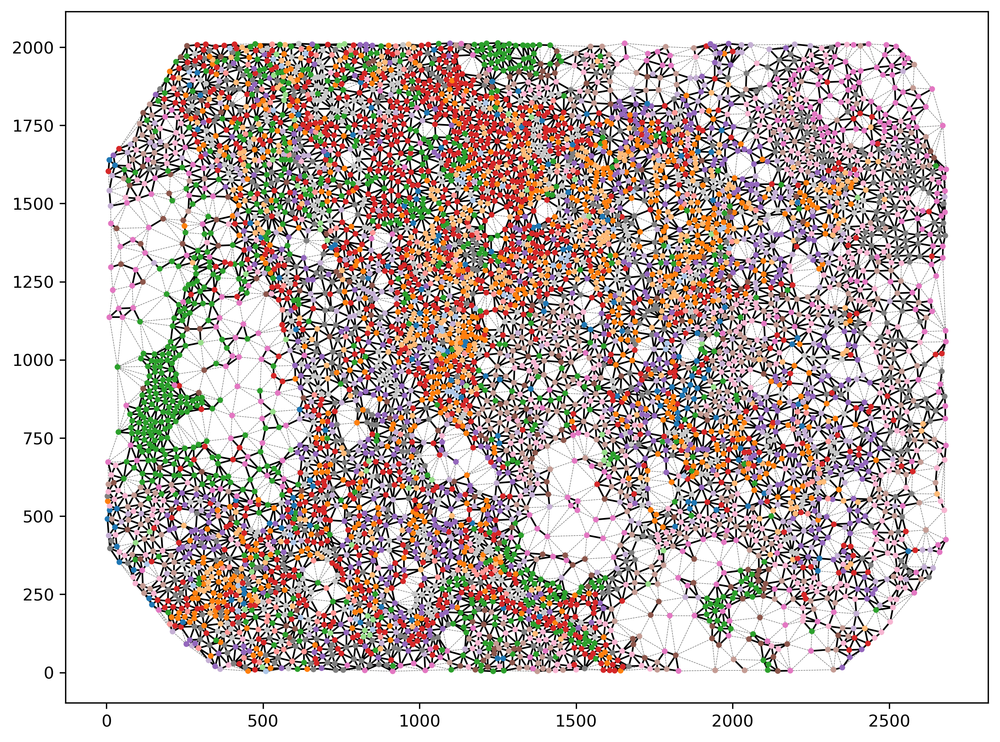

In [6]:
from IPython.display import Image 
pil_img = Image(filename=graph_img_output)
display(pil_img)

<br/><br/><br/><br/>

------------
### Step 2: Construct `CellularGraphDataset`

`CellularGraphDataset` will be the major data container used in model training and evaluation. This object also handles all the featurization, subgraph sampling, and other necessary functionalities for SPACE-GM.

We previously saved all regions as networkx graphs, now we initialize the dataset object using these graph files

In [7]:
dataset_root = "data/example_dataset"
dataset_kwargs = {
    'transform': [],
    'pre_transform': None,
    'raw_folder_name': 'graph',  # os.path.join(dataset_root, "graph") is the folder where we saved nx graphs
    'processed_folder_name': 'tg_graph',  # processed dataset files will be stored here
    'node_features': ["cell_type", "SIZE", "biomarker_expression", "neighborhood_composition", "center_coord"],  # There are all the cellular features that we want the dataset to compute
    'edge_features': ["edge_type", "distance"],  # edge (cell pair) features
    'subgraph_size': 3,  # indicating we want to sample 3-hop subgraphs from these regions (for training/inference), this is a core parameter for SPACE-GM.
    'subgraph_source': 'on-the-fly',
    'subgraph_allow_distant_edge': True,
    'subgraph_radius_limit': 200.,
}

feature_kwargs = {
    "biomarker_expression_process_method": "linear",
    "biomarker_expression_lower_bound": 0,
    "biomarker_expression_upper_bound": 18,
    "neighborhood_size": 10,
}
dataset_kwargs.update(feature_kwargs)

dataset = spacegm.CellularGraphDataset(dataset_root, **dataset_kwargs)

Processing...
Done!


<br/><br/><br/><br/>

The full cellular graph for each region in the dataset can be accessed using the class method `get_full`:

In [8]:
i = 0
dataset.get_full(i)

Data(x=[4301, 42], edge_index=[2, 25594], edge_attr=[25594, 2], num_nodes=4301, region_id='UPMC_c001_v001_r001_reg001', component_id=0)

<br/><br/><br/><br/>

And the n-hop (n=3 in this example) subgraph of region `i` around its center node `j` can be accessed using the class method `get_subgraph`: 

In [9]:
i = 0
j = 1234
dataset.get_subgraph(i, j)

Data(x=[44, 42], edge_index=[2, 216], edge_attr=[216, 2], center_node_index=20, original_center_node=1234, num_nodes=44, region_id='UPMC_c001_v001_r001_reg001', component_id=0)

<br/><br/><br/><br/>

By default, indexing the dataset object will yield an n-hop subgraph around a randomly picked center node (see class method `pick_center`) in the specified region:

In [10]:
dataset[0]

Data(x=[37, 42], edge_index=[2, 180], edge_attr=[180, 2], center_node_index=19, original_center_node=519, num_nodes=37, region_id='UPMC_c001_v001_r001_reg001', component_id=0)

<br/><br/><br/><br/>

There is also a quick plotting functions for subgraphs: `plot_subgraph`

(376.04999999999995, 709.95, 487.04999999999995, 820.95)

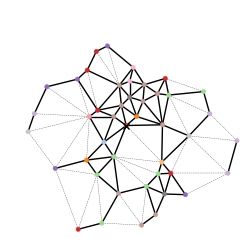

In [11]:
i = 0
j = 1234

plt.figure(figsize=(3, 3))
dataset.plot_subgraph(i, j)
plt.axis('off')

<br/><br/><br/><br/>

During training, due to the high throughput of data streaming, on-the-fly calculation of subgraph might be slow. To speed up data loading, we will save all subgraphs to chunk files first and load them during training/inference.

In [12]:
dataset.save_all_subgraphs_to_chunk()

In [13]:
import time

dataset.clear_cache()
dataset.set_subgraph_source('on-the-fly') # Can also be set through the `subgraph_source` argument
t0 = time.time()
for _ in range(5000):
    d = dataset[0]
t1 = time.time()
print("Sampling 5000 subgraphs on-the-fly took %.2f seconds" % (t1 - t0))

dataset.clear_cache()
dataset.set_subgraph_source('chunk_save')  
t0 = time.time()
for _ in range(5000):
    d = dataset[0]
t1 = time.time()
print("Loading 5000 subgraphs from chunk save took %.2f seconds" % (t1 - t0))


Sampling 5000 subgraphs on-the-fly took 7.74 seconds
Loading 5000 subgraphs from chunk save took 2.99 seconds


<br/><br/><br/><br/>

Transformers will be used to mask features, add node-level and graph-level tasks, etc.

In [14]:
transformers = [
    # `AddCenterCellType` will add `node_y` attribute to the subgraph for node-level prediction task
    # In this task we will mask the cell type of the center cell (replace it by a placeholder cell type)
    # and use its neighborhood to predict the true cell type
    spacegm.AddCenterCellType(dataset),
    # `AddGraphLabel` will add `graph_y` and `graph_w` attributes to the subgraph for graph-level prediction task
    spacegm.AddGraphLabel(graph_label_file, tasks=['survival_status']),
    # Transformer `FeatureMask` will zero mask all feature items not included in its argument
    # In this tutorial we perform training/inference using cell types and center cell's size feature
    spacegm.FeatureMask(dataset, use_center_node_features=['cell_type', 'SIZE'], use_neighbor_node_features=['cell_type']),
]

dataset.set_transforms([])  # No transformation
d1 = dataset[0]

dataset.set_transforms(transformers)
d2 = dataset[0]

<br/><br/>
`d1.x` has a full feature matrix, while `d2.x` only has the first column (for cell types) populated, except for its center cell, which has an additional feature of size.

(`d1` and `d2` are different subgraphs due to the random sampling)

In [15]:
print("\nFeatures of `d1`")
display(d1.x)
print("\nFeatures of `d2`")
display(d2.x)
print("\nCenter cell feature of `d2`")
display(d2.x[d2.center_node_index])


Features of `d1`


tensor([[4.0000e+00, 6.5693e-01, 1.1334e-01,  ..., 0.0000e+00, 2.0190e+03,
         1.0270e+03],
        [1.0000e+01, 2.9176e-01, 1.6938e-01,  ..., 0.0000e+00, 2.0840e+03,
         1.0440e+03],
        [1.4000e+01, 6.7744e-01, 1.5921e-01,  ..., 0.0000e+00, 1.9900e+03,
         1.0720e+03],
        ...,
        [1.1000e+01, 7.3152e-01, 1.3574e-01,  ..., 0.0000e+00, 1.9610e+03,
         1.2810e+03],
        [6.0000e+00, 5.7419e-01, 2.6556e-01,  ..., 0.0000e+00, 1.9970e+03,
         1.2830e+03],
        [8.0000e+00, 6.2952e-01, 5.6967e-01,  ..., 0.0000e+00, 2.0640e+03,
         1.3110e+03]], dtype=torch.float64)


Features of `d2`


tensor([[ 6.,  0.,  0.,  ...,  0.,  0.,  0.],
        [15.,  0.,  0.,  ...,  0.,  0.,  0.],
        [15.,  0.,  0.,  ...,  0.,  0.,  0.],
        ...,
        [ 7.,  0.,  0.,  ...,  0.,  0.,  0.],
        [12.,  0.,  0.,  ...,  0.,  0.,  0.],
        [ 9.,  0.,  0.,  ...,  0.,  0.,  0.]], dtype=torch.float64)


Center cell feature of `d2`


tensor([16.0000,  0.4380,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000,  0.0000], dtype=torch.float64)

<br/><br/>

Note that d2 has additional attributes: `d2.node_y`, `d2.graph_y`, `d2.graph_w`

In [16]:
display(d1)
display(d2)

Data(x=[39, 42], edge_index=[2, 188], edge_attr=[188, 2], center_node_index=20, original_center_node=2334, num_nodes=39, region_id='UPMC_c001_v001_r001_reg001', component_id=0)

Data(x=[41, 42], edge_index=[2, 202], edge_attr=[202, 2], center_node_index=21, original_center_node=1982, num_nodes=41, region_id='UPMC_c001_v001_r001_reg001', component_id=0, node_y=[1], graph_y=[1, 1], graph_w=[1, 1])

<br/><br/><br/><br/>

------

### Step 3 Initialize a Graph Neural Network (GNN)

Now we construct a graph neural network for predicting `survival_status`.

The graph neural network will be composed of 3 parts:
1. The backbone GNN with specified number of graph convolutional layers
2. A node task prediction module if there are node-level tasks defined, this module will be constructed based on the node embedding of the center node
3. A graph task prediction module if there are graph-level tasks defined, this module will be constructed based on the graph-pooled embedding of all the nodes

In [17]:
model_kwargs = {
    'num_layer': dataset.subgraph_size,  # same number of layers as number of hops in the subgraphs
    'num_node_type': len(dataset.cell_type_mapping) + 1,  # number of embeddings for different cell types (plus one placeholder cell type)
    'num_feat': dataset[0].x.shape[1] - 1,  # exclude the cell type column
    'emb_dim': 512, 
    'num_node_tasks': len(dataset.cell_type_mapping),  # A multi-class classification task: predicting center cell type
    'num_graph_tasks': 1,  # a binary classification task
    'node_embedding_output': 'last', 
    'drop_ratio': 0.25, 
    'graph_pooling': "max", 
    'gnn_type': 'gin',
}

model = spacegm.GNN_pred(**model_kwargs)
device = 'cpu'

display(model)

GNN_pred(
  (gnn): GNN(
    (x_embedding): Embedding(17, 512)
    (feat_embedding): Linear(in_features=41, out_features=512, bias=True)
    (gnns): ModuleList(
      (0): GINConv()
      (1): GINConv()
      (2): GINConv()
    )
    (batch_norms): ModuleList(
      (0): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (graph_pred_module): Sequential(
    (0): Linear(in_features=512, out_features=512, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): Linear(in_features=512, out_features=512, bias=True)
    (3): LeakyReLU(negative_slope=0.01)
    (4): Linear(in_features=512, out_features=1, bias=True)
  )
  (node_pred_module): Sequential(
    (0): Linear(in_features=512, out_features=512, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): Linear

<br/><br/><br/><br/>

------

### Step 4 Train the GNN

GNNs in SPACE-GM are trained using n-hop subgraphs, see `data.SubgraphSampler` for details.

In this tutorial we specified one node-level task (predicting center cell type) and one graph-level task (predicting binary survival status), each task will have a specific loss function.


In [18]:
train_kwargs = {
    'batch_size': 64,
    'lr': 0.001,
    'graph_loss_weight': 1.0,  # Weight of graph task loss relative to node task loss
    'num_iterations': 50,  # In this demo we only train for 50 iterations/batches

    # Loss functions
    'node_task_loss_fn': nn.CrossEntropyLoss(),
    'graph_task_loss_fn': spacegm.models.BinaryCrossEntropy(),    

    # Evaluation during training
    'evaluate_fn': [spacegm.train.evaluate_by_sampling_subgraphs, spacegm.train.evaluate_by_full_graph, spacegm.train.save_model_weight],
    'evaluate_freq': 10,  # Evaluate the model every 10 iterations
}

<br/><br/>

On-the-fly evaluation of model performances is included in the training pipeline:

In [19]:
evaluate_kwargs = {
    'node_task_evaluate_fn': spacegm.inference.cell_type_prediction_evaluate_fn,
    'graph_task_evaluate_fn': spacegm.inference.graph_classification_evaluate_fn,
    'full_graph_node_task_evaluate_fn': spacegm.inference.full_graph_cell_type_prediction_evaluate_fn,
    'full_graph_graph_task_evaluate_fn': spacegm.inference.full_graph_graph_classification_evaluate_fn,
    'num_eval_iterations': 10,
    'score_file': os.path.join(model_save_root, 'GIN-example.txt'),
    'model_folder': os.path.join(model_save_root, 'GIN-example'),
}
train_kwargs.update(evaluate_kwargs)

<br/><br/>

Run training:

In [20]:
model = spacegm.train.train_subgraph(
    model, 
    dataset,
    device,
    train_inds=[0, 1, 2, 3],
    valid_inds=[0, 1, 2, 3],
    **train_kwargs)

Finished iterations 10
Finished iterations 20
Finished iterations 30
Finished iterations 40


<br/><br/>

Evaluation metrics during training are saved in the specified score file:

In [21]:
with open(evaluate_kwargs['score_file'], 'r') as f:
    for line in f.readlines():
        print(line)

Eval-Subgraph,Train,node-score,0.131,0.147,0.322,0.466,graph-score,0.752,Valid,node-score,0.135,0.145,0.311,0.453,graph-score,0.751

Eval-Full-Graph,Train,node-score,0.131,0.151,0.290,0.407,graph-score,1.000,Valid,node-score,0.137,0.160,0.302,0.425,graph-score,1.000

Eval-Subgraph,Train,node-score,0.212,0.252,0.531,0.639,graph-score,0.754,Valid,node-score,0.195,0.222,0.470,0.592,graph-score,0.779

Eval-Full-Graph,Train,node-score,0.162,0.179,0.406,0.545,graph-score,1.000,Valid,node-score,0.164,0.179,0.409,0.537,graph-score,1.000

Eval-Subgraph,Train,node-score,0.258,0.316,0.597,0.730,graph-score,0.825,Valid,node-score,0.233,0.281,0.589,0.728,graph-score,0.856

Eval-Full-Graph,Train,node-score,0.219,0.261,0.607,0.767,graph-score,1.000,Valid,node-score,0.220,0.264,0.625,0.780,graph-score,1.000

Eval-Subgraph,Train,node-score,0.217,0.280,0.491,0.650,graph-score,0.773,Valid,node-score,0.212,0.273,0.503,0.673,graph-score,0.765

Eval-Full-Graph,Train,node-score,0.161,0.211,0.454,0.620,graph-

<br/><br/>

Intermediate model weights are saved in the specified model folder:

In [22]:
print(os.listdir(evaluate_kwargs['model_folder']))

['model_save_0.pt', 'model_save_1.pt', 'model_save_2.pt', 'model_save_3.pt']


<br/><br/><br/><br/>

------

### Step 5 Evaluate the GNN

As GNNs are trained using subgraphs, there are two ways for evaluation (especially for graph-level tasks):

- Sample subgraphs and calculate metrics by treating each subgraph as an independent data point;
- Iterate over all the subgraphs (cells) of each region and calculate metrics, for graph-level tasks treat the aggregated (average) prediction from a region as an independent data point;

This is also reflected in the on-the-fly evaluation above: `spacegm.train.evaluate_by_sampling_subgraphs` and `spacegm.train.evaluate_by_full_graph`.

Here we demonstrate the two types of evaluation:

In [23]:
# Evaluation by iterating over the full graph
node_preds, graph_preds = spacegm.inference.collect_predict_for_all_nodes(
    model, dataset, device, inds=np.arange(4), print_progress=True)

# Aggregated (average) predictions of each region
for i, pred in graph_preds.items():
    region_id = dataset[i].region_id
    predicted_prob = 1 / (1 + np.exp(-np.array(pred)))  # Sigmoid
    avg_pred = np.mean(predicted_prob)
    print("On region %s, average prediction: %.3f" % (region_id, avg_pred))

spacegm.inference.full_graph_graph_classification_evaluate_fn(dataset, graph_preds, print_res=True)

predict on 0
predict on 1
predict on 2
predict on 3
On region UPMC_c001_v001_r001_reg001, average prediction: 0.928
On region UPMC_c001_v001_r001_reg004, average prediction: 0.936
On region UPMC_c001_v001_r001_reg009, average prediction: 0.741
On region UPMC_c001_v001_r001_reg014, average prediction: 0.758
GRAPH [1.0]


[1.0]

In [24]:
# Evaluation by sampling subgraphs
node_preds, node_labels, graph_preds, graph_ys, graph_ws = spacegm.inference.collect_predict_by_random_sample(
    model, dataset, device, inds=np.arange(4), num_eval_iterations=50)
spacegm.inference.graph_classification_evaluate_fn(graph_preds, graph_ys, graph_ws)

GRAPH [0.8065091463414634]


[0.8065091463414634]